<a href="https://colab.research.google.com/github/YYC-CHUAN/dip-CTuse/blob/main/Restoration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Code for the figures, where an image is restored from a fraction of pixels (fig. 7 bottom, fig. 14 of supmat).


In [1]:
"""
*Uncomment if running on colab*
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab
"""
!git clone https://github.com/YYC-CHUAN/dip-CTuse.git
!mv dip-CTuse/* ./

Cloning into 'dip-CTuse'...
remote: Enumerating objects: 455, done.
remote: Counting objects: 100% (140/140), done.
remote: Compressing objects: 100% (133/133), done.
remote: Total 455 (delta 81), reused 7 (delta 7), pack-reused 315 (from 2)
Receiving objects: 100% (455/455), 73.88 MiB | 15.93 MiB/s, done.
Resolving deltas: 100% (168/168), done.


# Import libs

In [2]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import skimage
print(skimage.__version__)

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models.resnet import ResNet
from models.unet import UNet
from models.skip import skip
from models import get_net
import torch
import torch.optim
# from skimage.measure import compare_psnr
from skimage.metrics import peak_signal_noise_ratio

from utils.inpainting_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

PLOT = True
imsize=-1
dim_div_by = 64
dtype = torch.cuda.FloatTensor

0.25.0


# Choose figure

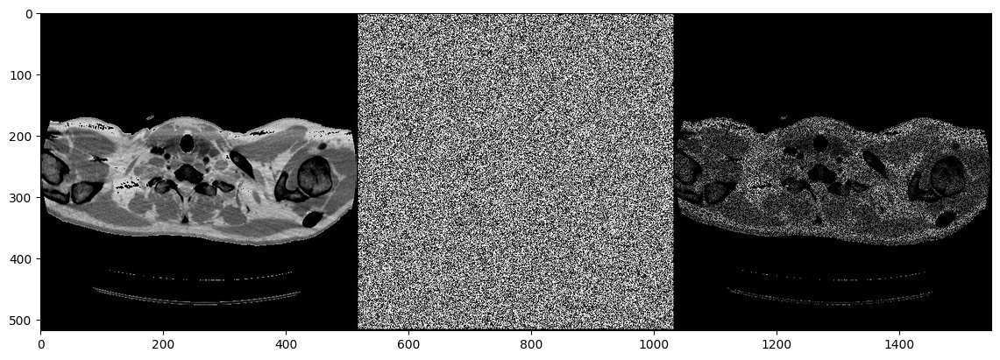

In [3]:
# fig. 7 (bottom)
f = './data-new/Restoration/1-0002.gif'

img_pil, img_np = get_image(f, imsize)

if '1-0002' in f:
    img_np = nn.ReflectionPad2d(1)(np_to_torch(img_np))[0].numpy()
    img_pil = np_to_pil(img_np)

    img_mask = get_bernoulli_mask(img_pil, 0.50)
    img_mask_np = pil_to_np(img_mask)


else:
    assert False


img_masked = img_np * img_mask_np

mask_var = np_to_torch(img_mask_np).type(dtype)

plot_image_grid([img_np, img_mask_np, img_mask_np * img_np], 3,11);

# Set up everything

In [4]:
show_every=100
figsize=5
pad = 'reflection' # 'zero'
INPUT = 'noise'
input_depth = 32
OPTIMIZER = 'adam'
OPT_OVER =  'net'
if '1-0002' in f:
    OPTIMIZER = 'adam'

    LR = 0.001
    num_iter = 11000
    reg_noise_std = 0.03

    NET_TYPE = 'skip'
    net = get_net(input_depth, 'skip', pad, n_channels=1,
                  skip_n33d=128,
                  skip_n33u=128,
                  skip_n11=4,
                  num_scales=5,
                  upsample_mode='bilinear').type(dtype)

# Loss
mse = torch.nn.MSELoss().type(dtype)
img_var = np_to_torch(img_np).type(dtype)

net_input = get_noise(input_depth, INPUT, img_np.shape[1:]).type(dtype).detach()


# Main loop

Starting optimization with ADAM


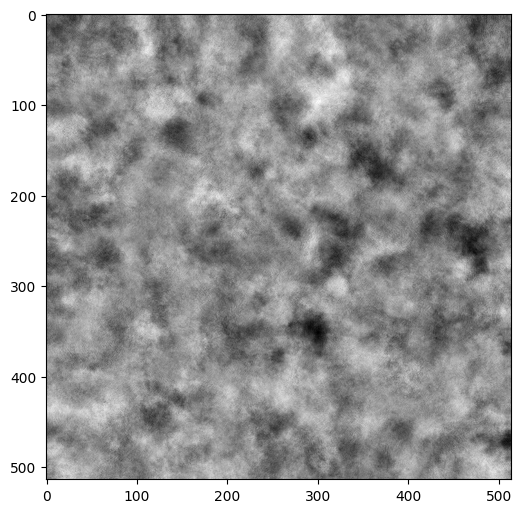

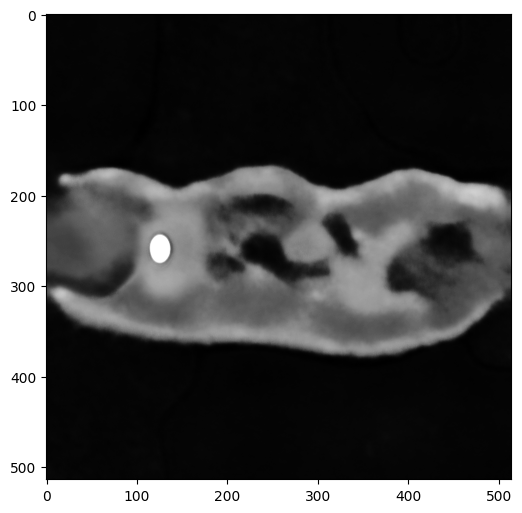

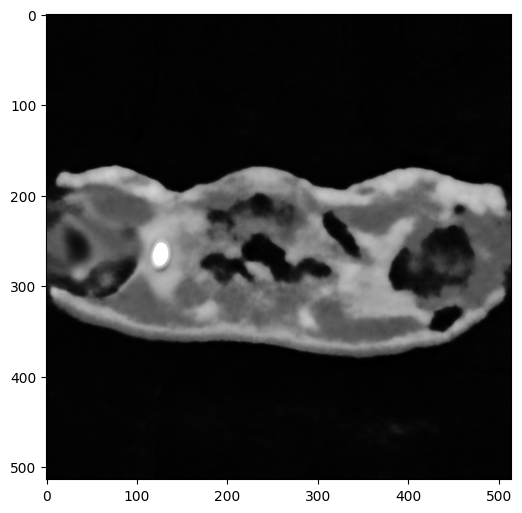

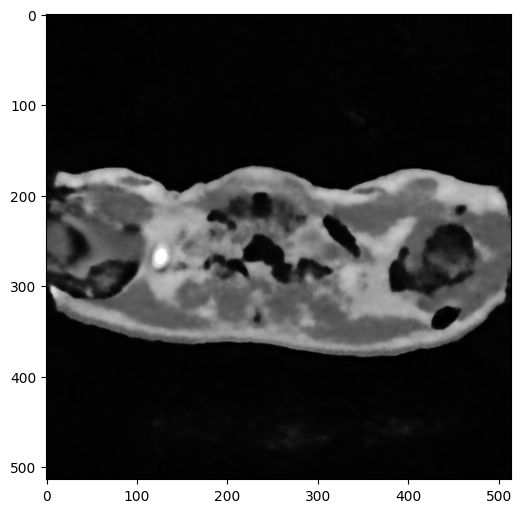

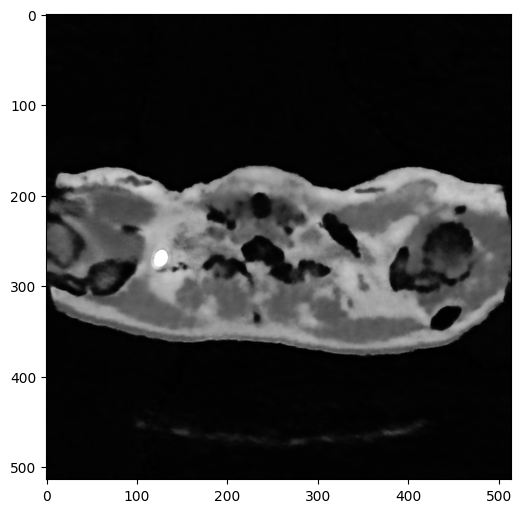

...

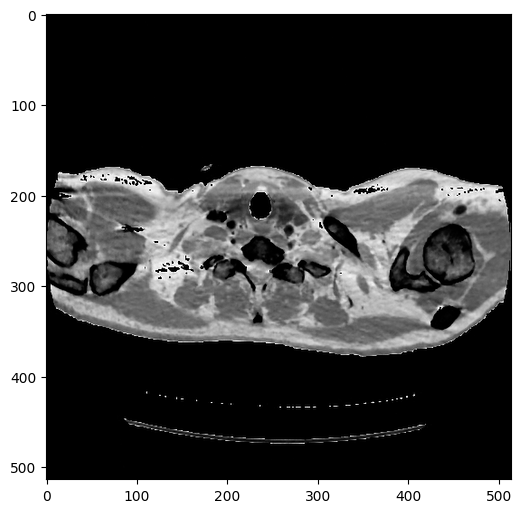

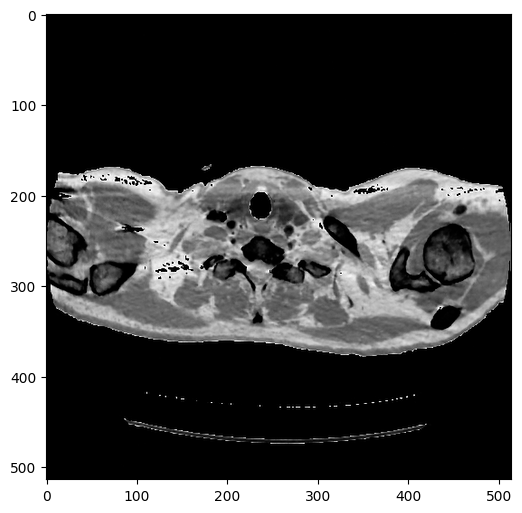

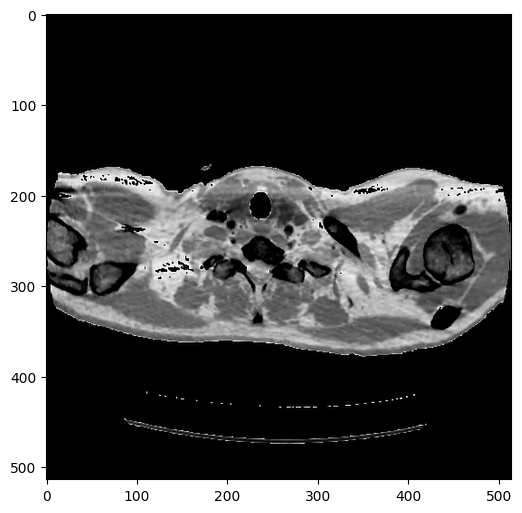

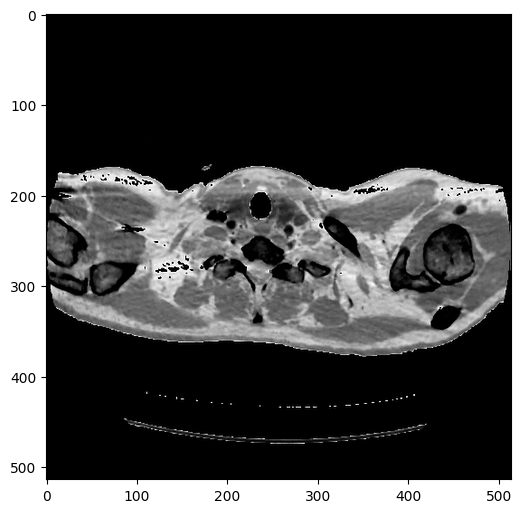

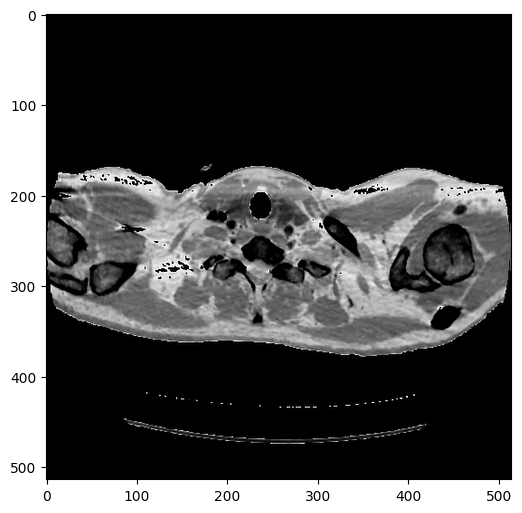

Falling back to previous checkpoint.


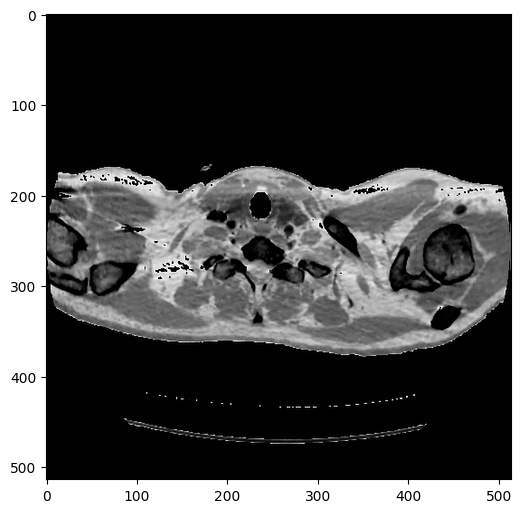

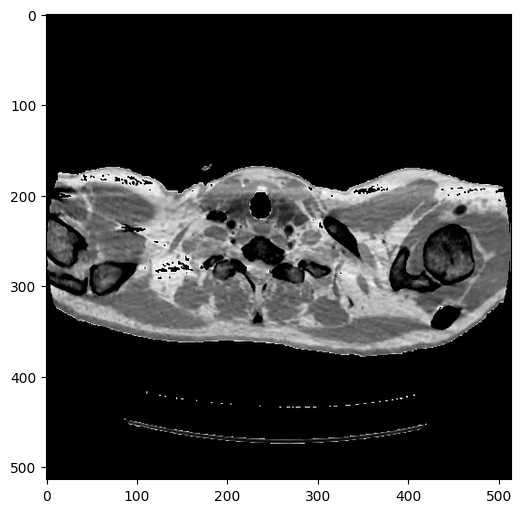

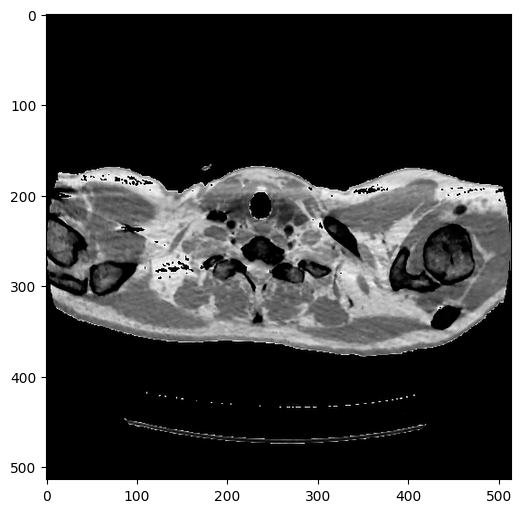

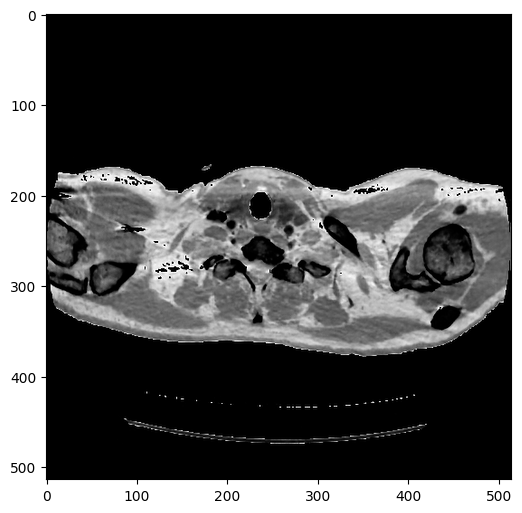

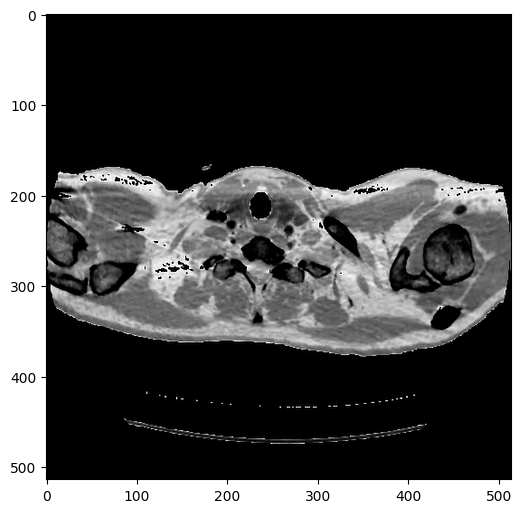

...

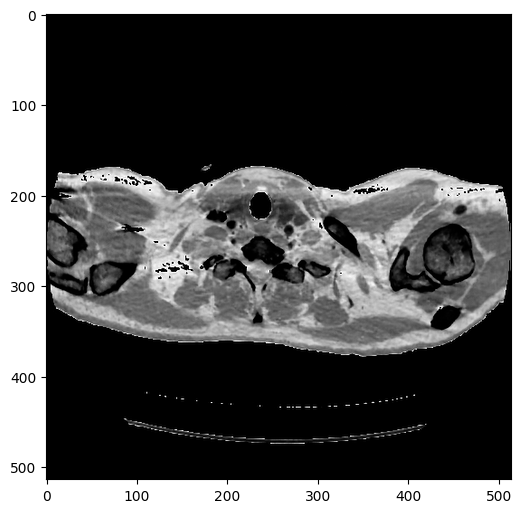

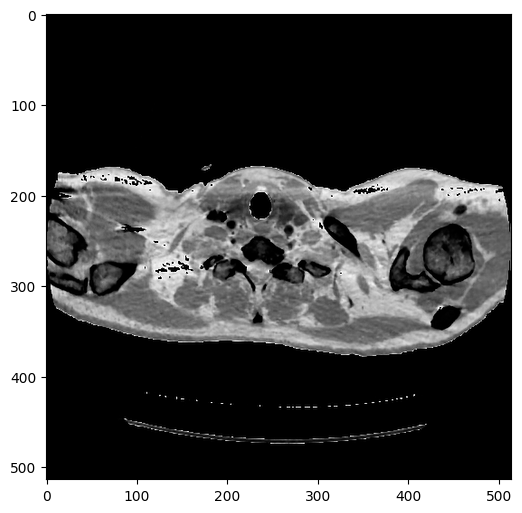

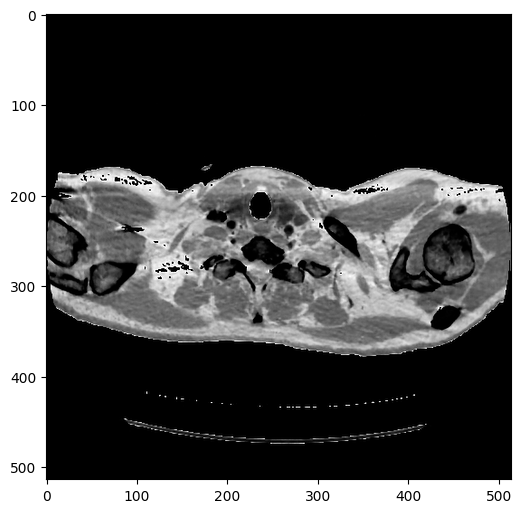

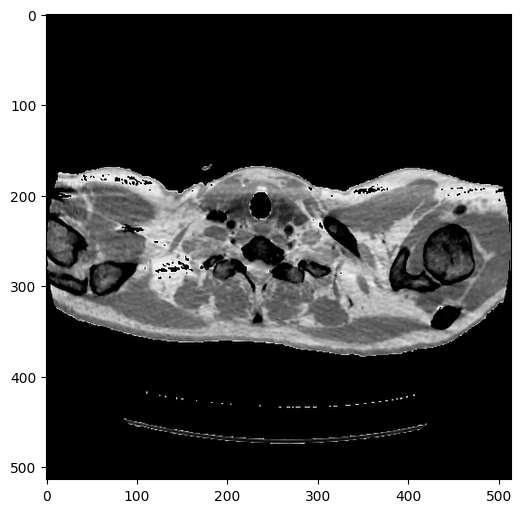

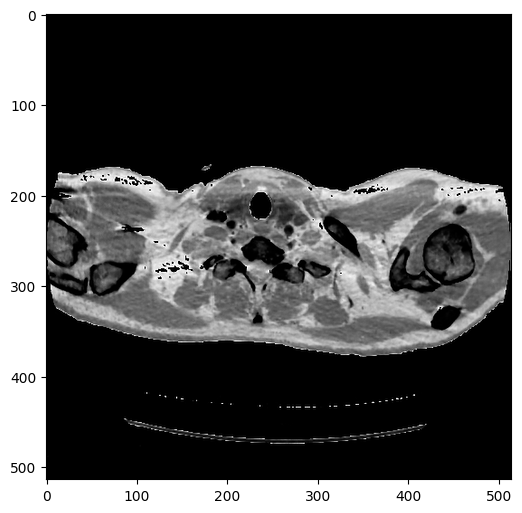

Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.
Falling back to previous checkpoint.


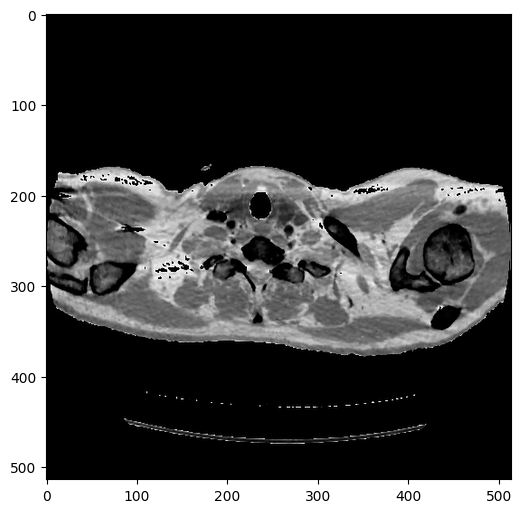

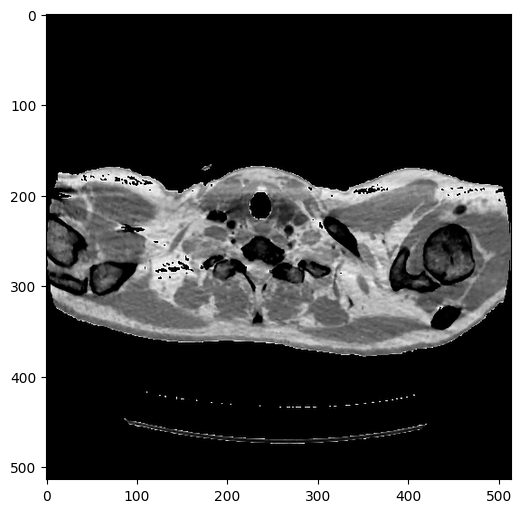

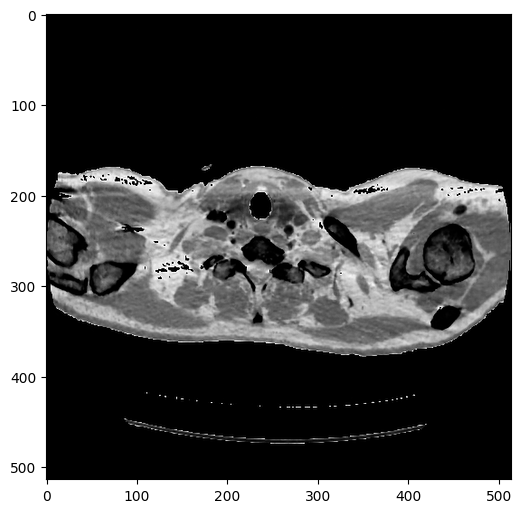

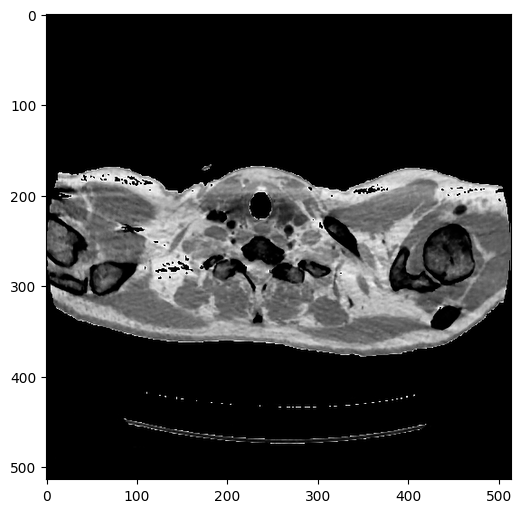

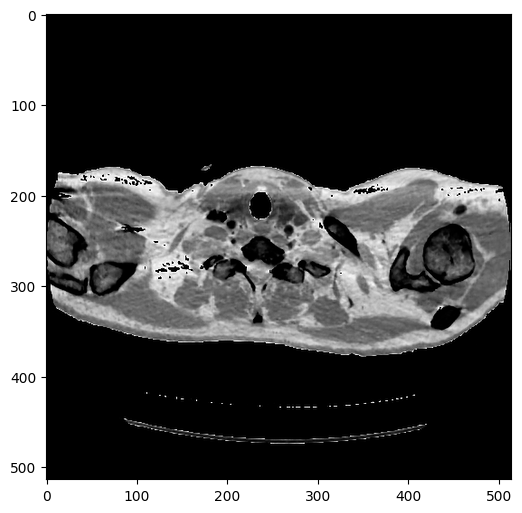

...

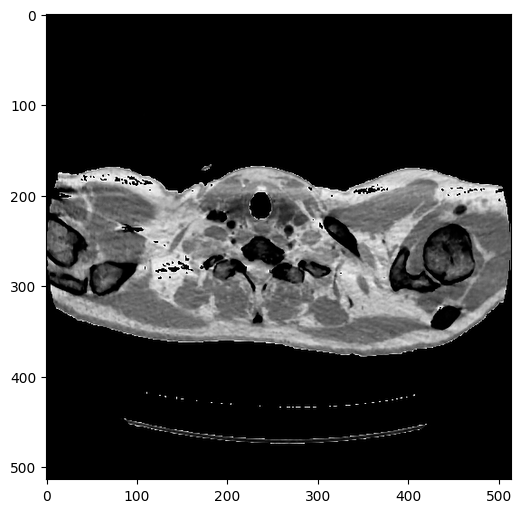

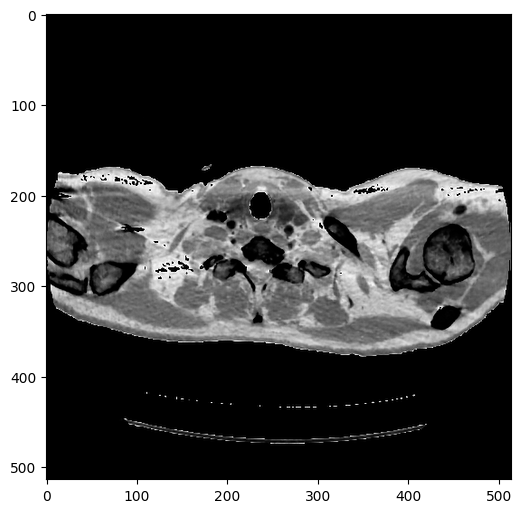

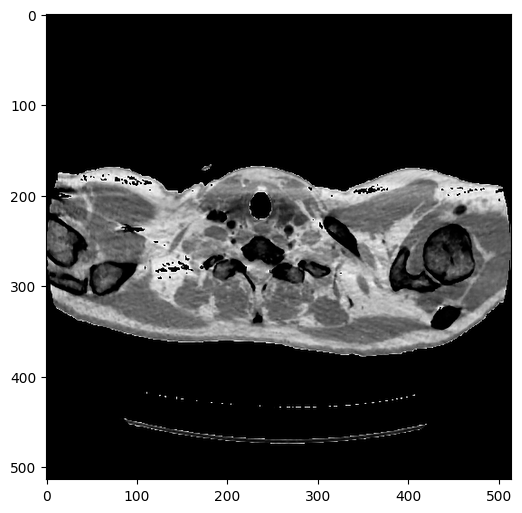

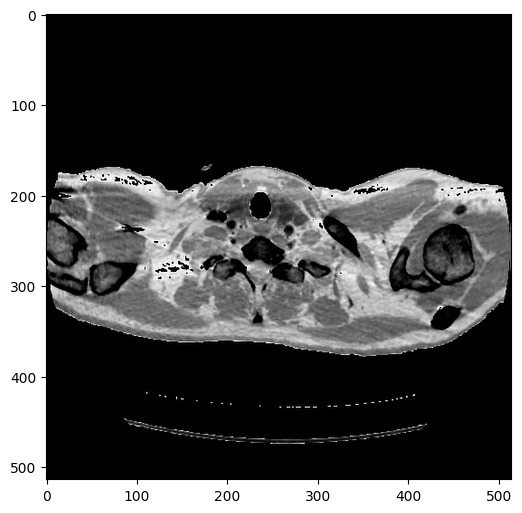

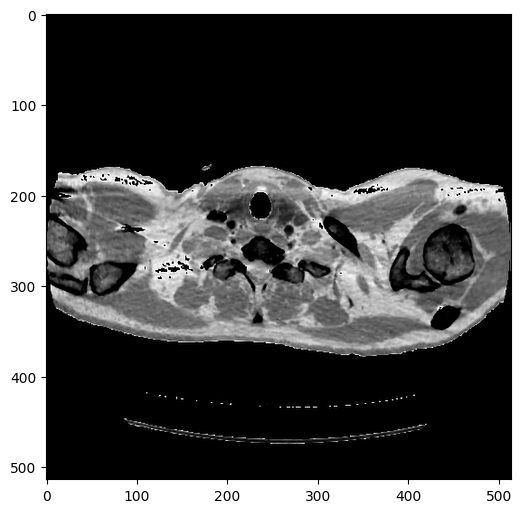

Falling back to previous checkpoint.


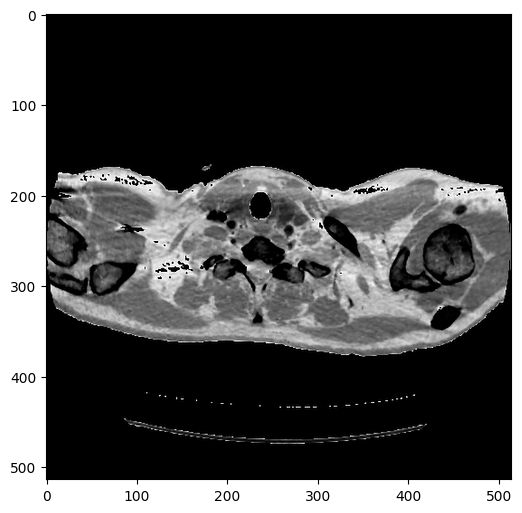

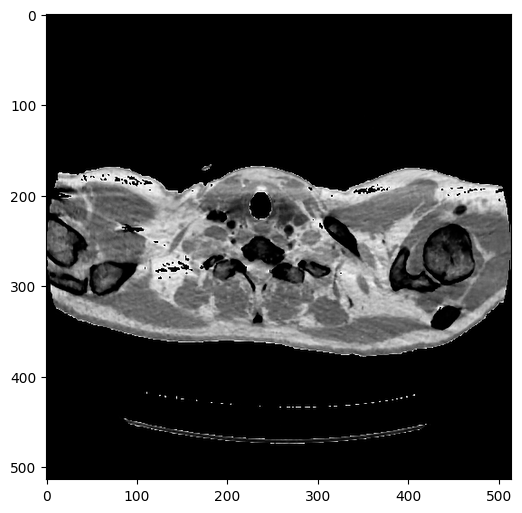

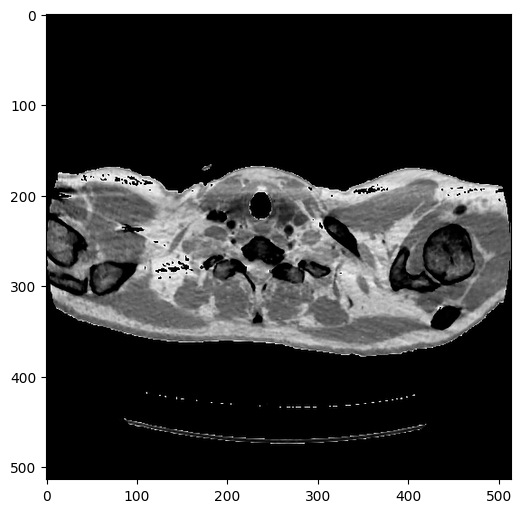

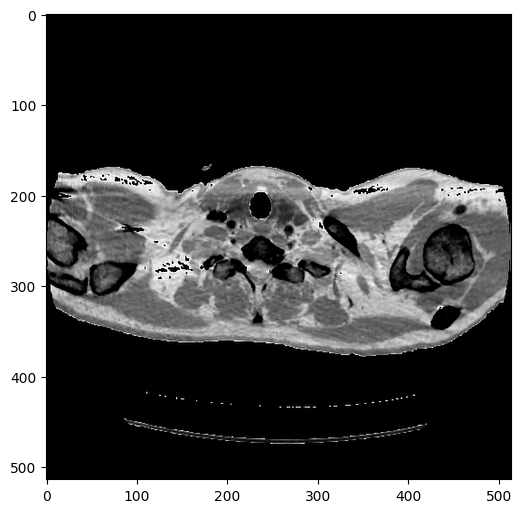

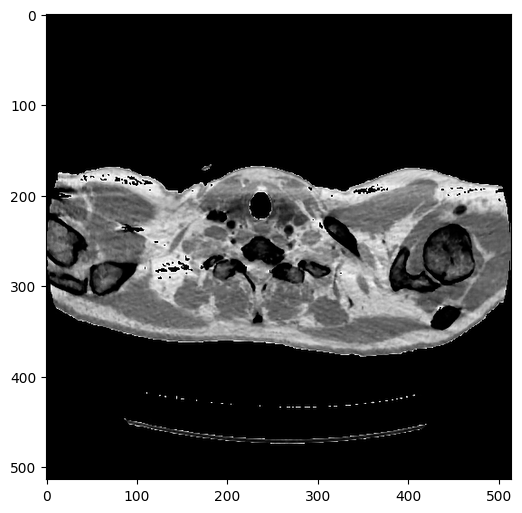

...

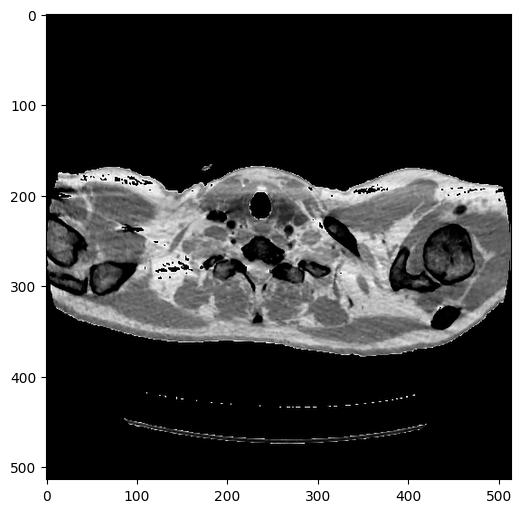

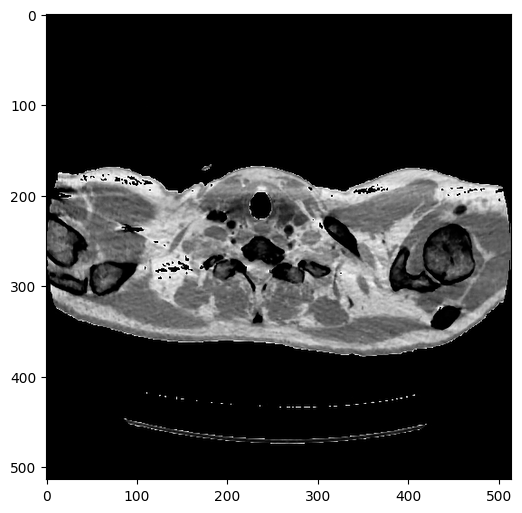

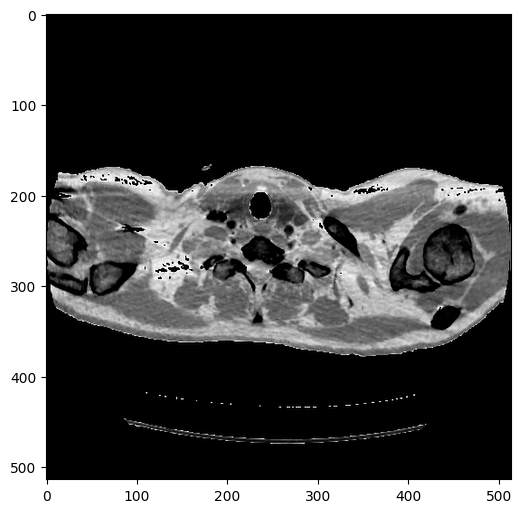

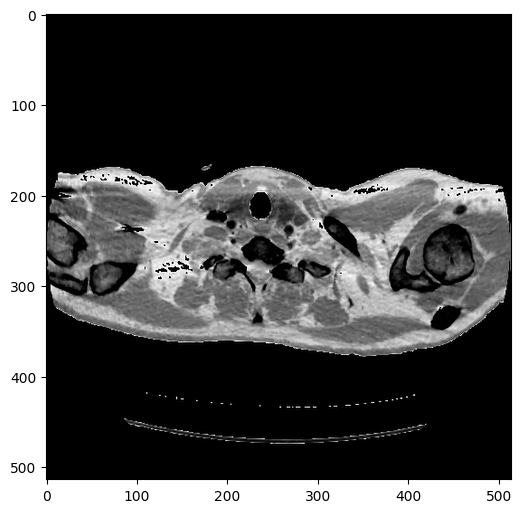

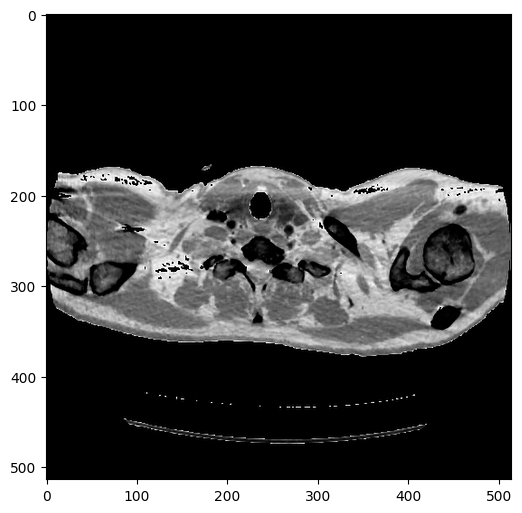

Falling back to previous checkpoint.


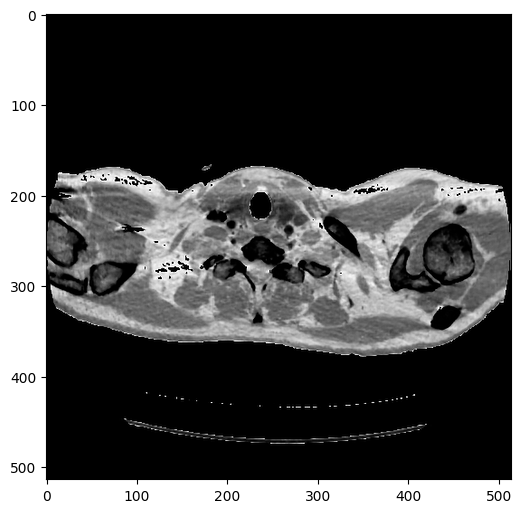

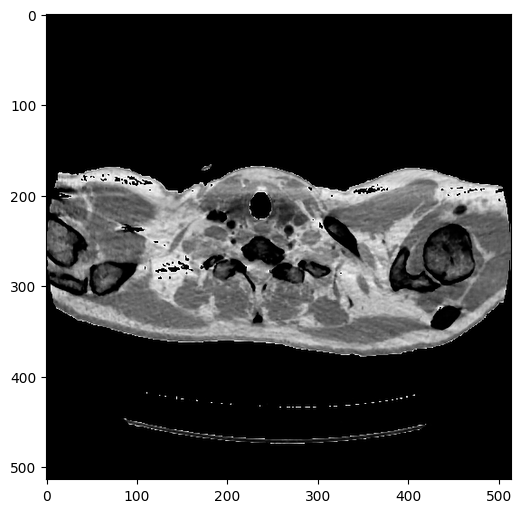

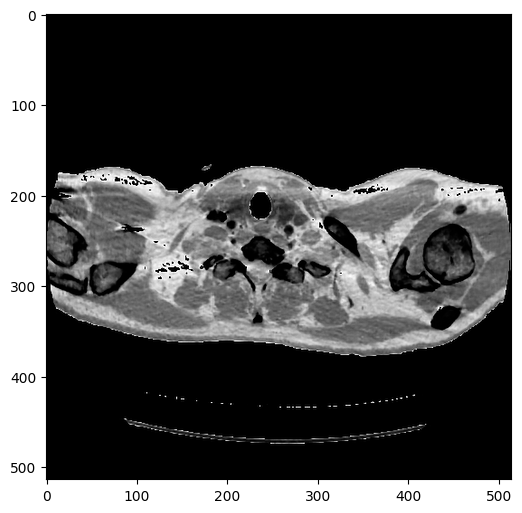

In [5]:
def closure():

    global i, psrn_masked_last, last_net, net_input

    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = net(net_input)

    total_loss = mse(out * mask_var, img_var * mask_var)
    total_loss.backward()

    psrn_masked = peak_signal_noise_ratio(img_masked, out.detach().cpu().numpy()[0] * img_mask_np)
    psrn = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0])

    print ('Iteration %05d    Loss %f PSNR_masked %f PSNR %f' % (i, total_loss.item(), psrn_masked, psrn),'\r', end='')


    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)

        # Backtracking
        if psrn_masked - psrn_masked_last < -5:
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.cpu() for x in net.parameters()]
            psrn_masked_last = psrn_masked

        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1)

    i += 1

    return total_loss

# Init globals
last_net = None
psrn_masked_last = 0
i = 0

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

# Run
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR=LR, num_iter=num_iter)

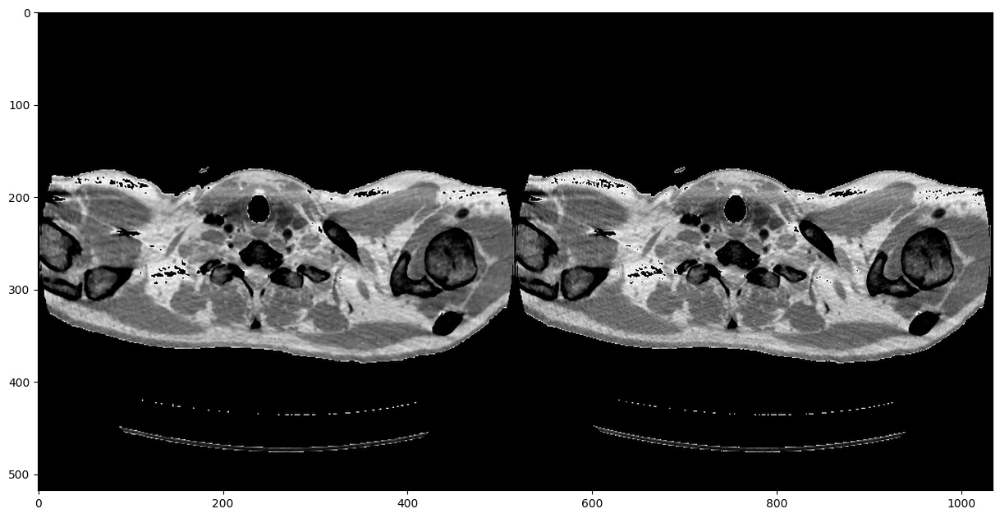

In [6]:
out_np = torch_to_np(net(net_input))
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);